In [1]:
from __future__ import annotations

import json
import logging
import math
import os
import pickle
import shutil
from itertools import combinations
from traceback import format_exception
from typing import Any, Optional, TypeAlias

import cv2
import numpy as np
import numpy.typing as npt
import ray
from matplotlib import pyplot as plt
from tqdm import tqdm

log = logging.getLogger("aa72")
with open("logging.config.json", "rt") as f:
    logging.config.dictConfig(json.load(f))

Image: TypeAlias = npt.NDArray[np.integer]

Pixel: TypeAlias = npt.NDArray[np.integer]
PixelArray: TypeAlias = npt.NDArray[np.integer]

Point: TypeAlias = npt.NDArray[np.floating] | Pixel
PointArray: TypeAlias = npt.NDArray[np.floating] | PixelArray

# Load data

In [2]:
IMGS_DIR = os.path.join("data", "imgs")

In [3]:
def get_piece_id(file_name: str) -> int:
    return int(os.path.splitext(file_name)[0])


def load_img(path: str) -> Image:
    assert os.path.exists(path)

    img = cv2.imread(path)
    # Orient imgs horizontally for preview
    if img.shape[0] > img.shape[1]:
        img = np.rot90(img)

    return np.ascontiguousarray(img)

In [4]:
imgs_raw = {}
for file_name in tqdm(os.listdir(IMGS_DIR)):
    piece_id = get_piece_id(file_name)

    if piece_id in (153, 707, 766, 900):
        imgs_raw[piece_id] = load_img(os.path.join(IMGS_DIR, file_name))

pieces_ids = set(imgs_raw.keys())

100%|██████████| 2000/2000 [00:00<00:00, 2575.92it/s]


# Preview utils

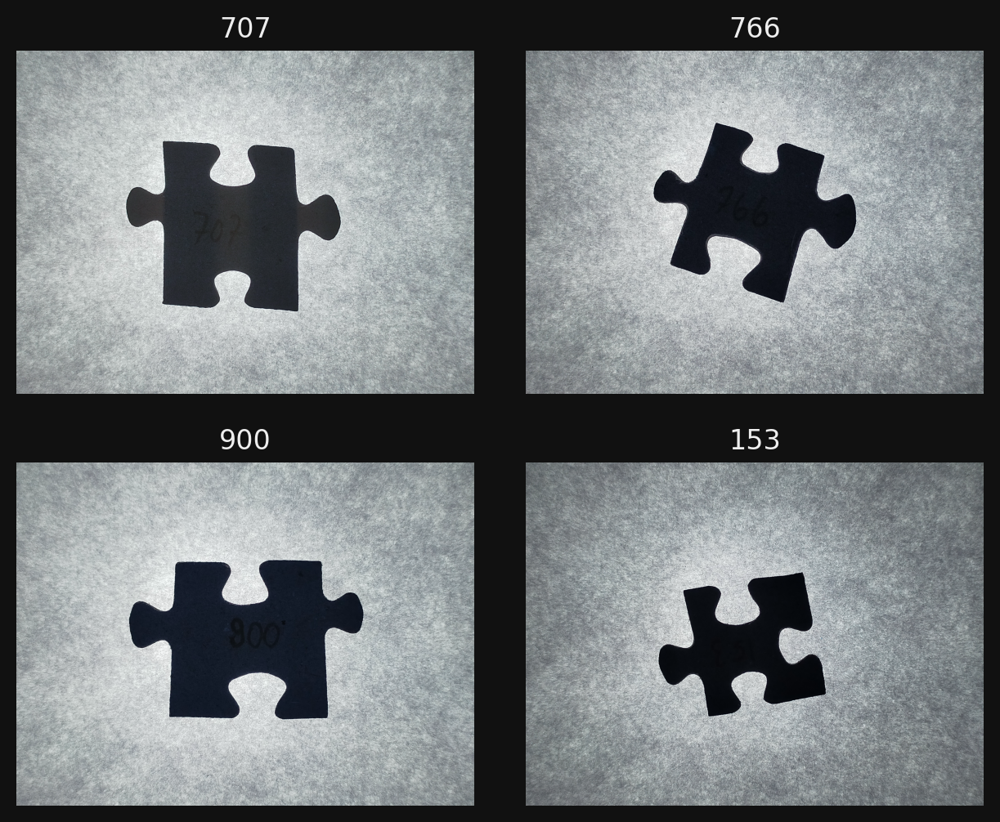

In [5]:
RED = (255, 0, 0)
GREEN = (0, 255, 0)
BLUE = (0, 0, 255)

plt.rcParams.update(
    {
        "figure.facecolor": "#111",
        "axes.facecolor": "#111",
        "text.color": "#eee",
        "axes.labelcolor": "#eee",
        "xtick.color": "#eee",
        "ytick.color": "#eee",
        "image.cmap": "cividis",
    }
)


def show_imgs(images: dict[int, Image]) -> None:
    titles = list(images.keys())
    imgs = list(images.values())

    n_cols = 2
    n_rows = math.ceil(len(imgs) / n_cols)
    fig, axes = plt.subplots(n_rows, n_cols)

    if isinstance(axes, plt.Axes):
        axes = [axes]
    else:
        axes = list(axes.flat)

    fig.set_figwidth(n_cols * 4)
    fig.set_figheight(n_rows * 3)
    fig.subplots_adjust(wspace=0.01, hspace=0.2)
    fig.set_dpi(200)

    for ax in axes:
        ax.set_axis_off()

    for ax, img, title in zip(axes, imgs, titles):
        ax.set_title(title)
        ax.imshow(img)

    plt.show()


show_imgs(imgs_raw)

# Binarization

1. Convert the image to grayscale, simplifying the color information for subsequent processing.
2. Apply a blur to the image to reduce high-frequency noise, making sure not to overdo it, so that edge details are preserved.
3. Convert pixel values to binary based on a visually estimated threshold.

In [6]:
def to_grayscale(img: Image) -> Image:
    return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)


def to_blurred(img: Image) -> Image:
    return cv2.medianBlur(img, ksize=17)


def to_binary(img: Image) -> Image:
    return cv2.threshold(src=img, thresh=110, maxval=255, type=cv2.THRESH_BINARY)[1]

100%|██████████| 4/4 [00:01<00:00,  3.63it/s]

[2024-01-27 15:07:17][INFO] Grayscale:


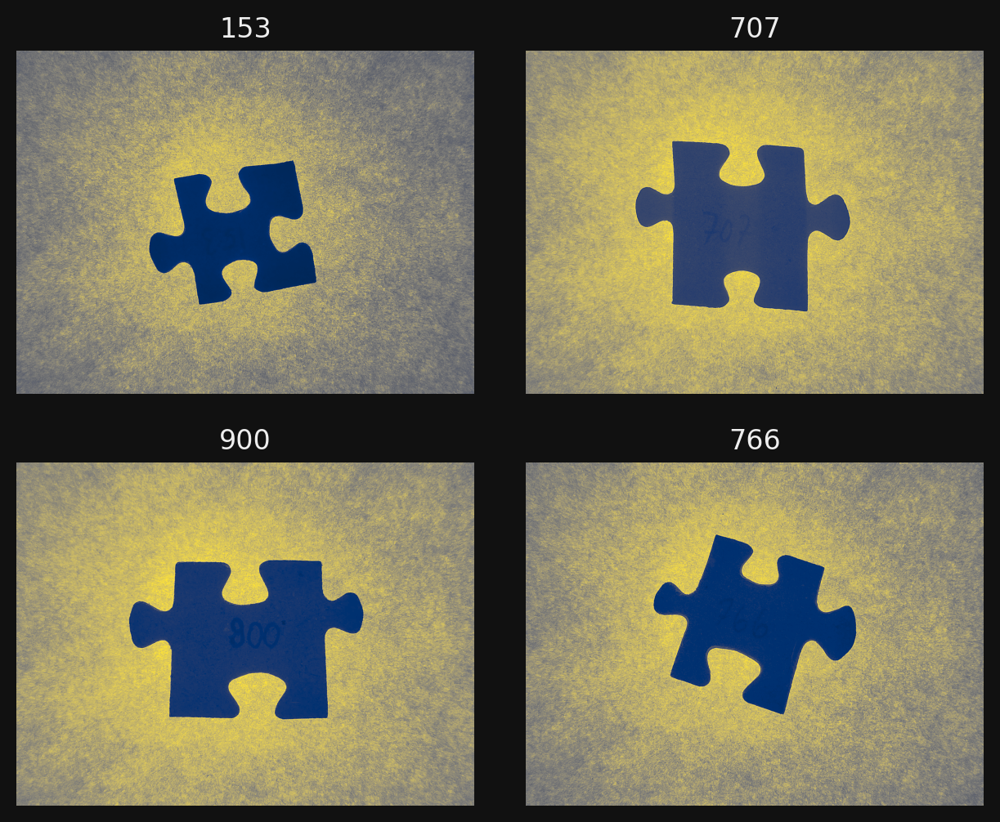

[2024-01-27 15:07:20][INFO] Blurred:


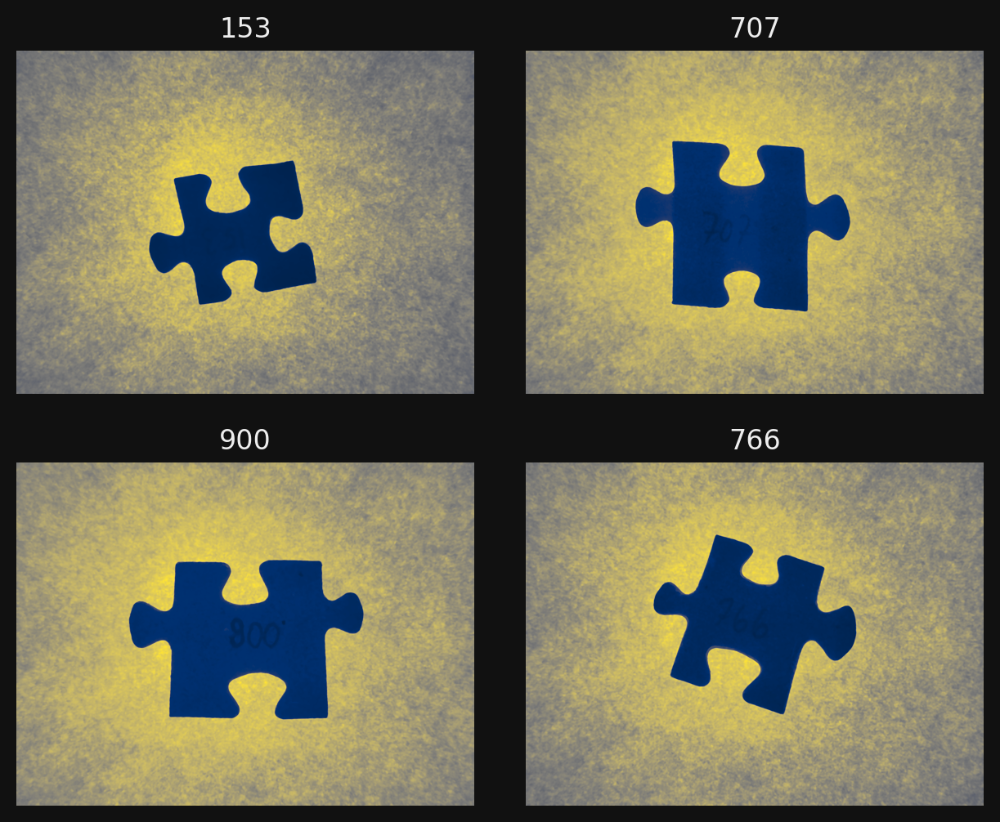

[2024-01-27 15:07:22][INFO] Binary:


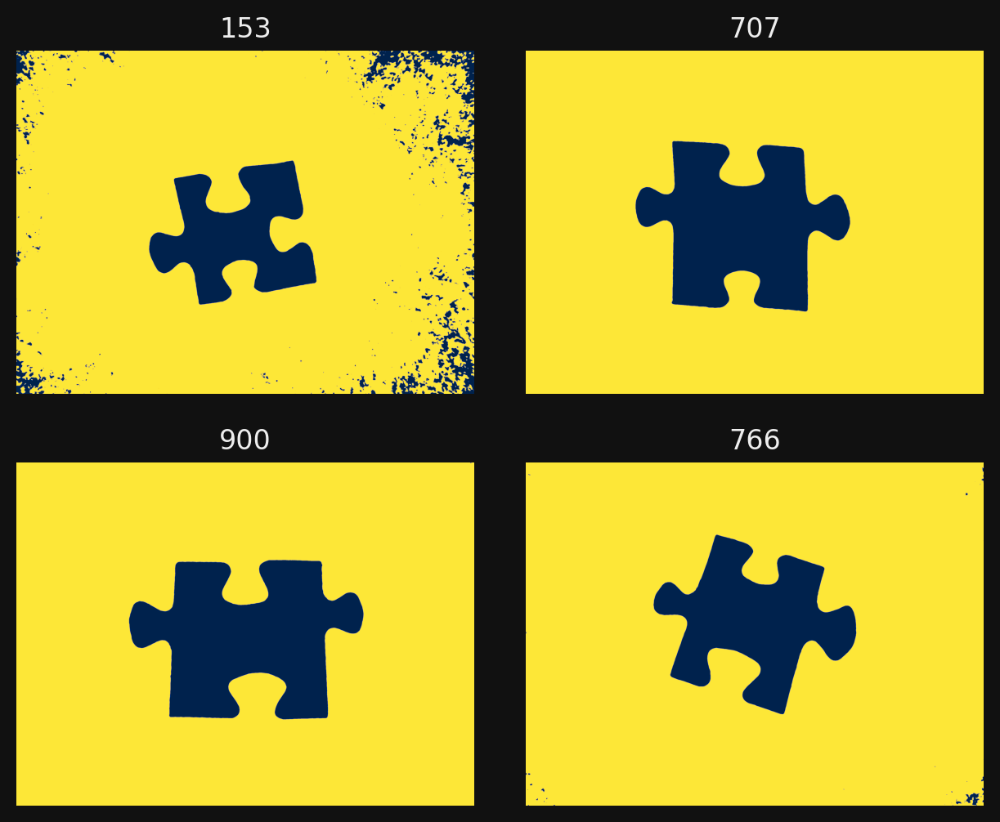

In [7]:
imgs_grayscale = {}
imgs_blurred = {}
imgs_binary = {}
for piece_id in tqdm(pieces_ids):
    imgs_grayscale[piece_id] = to_grayscale(imgs_raw[piece_id])
    imgs_blurred[piece_id] = to_blurred(imgs_grayscale[piece_id])
    imgs_binary[piece_id] = to_binary(imgs_blurred[piece_id])

log.info("Grayscale:")
show_imgs(imgs_grayscale)
log.info("Blurred:")
show_imgs(imgs_blurred)
log.info("Binary:")
show_imgs(imgs_binary)

# Contour extraction

Extract contours from a binary image and eliminate noise by assuming that the puzzle piece's contour corresponds to the largest component.


In [8]:
def get_piece_contour(img_binary: Image) -> PixelArray:
    img_binary = cv2.bitwise_not(img_binary)
    contours, _ = cv2.findContours(img_binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    piece_contours = sorted(contours, key=len, reverse=True)[0]
    piece_contours = piece_contours.reshape((piece_contours.shape[0], 2))
    return piece_contours

100%|██████████| 4/4 [00:00<00:00, 31.06it/s]


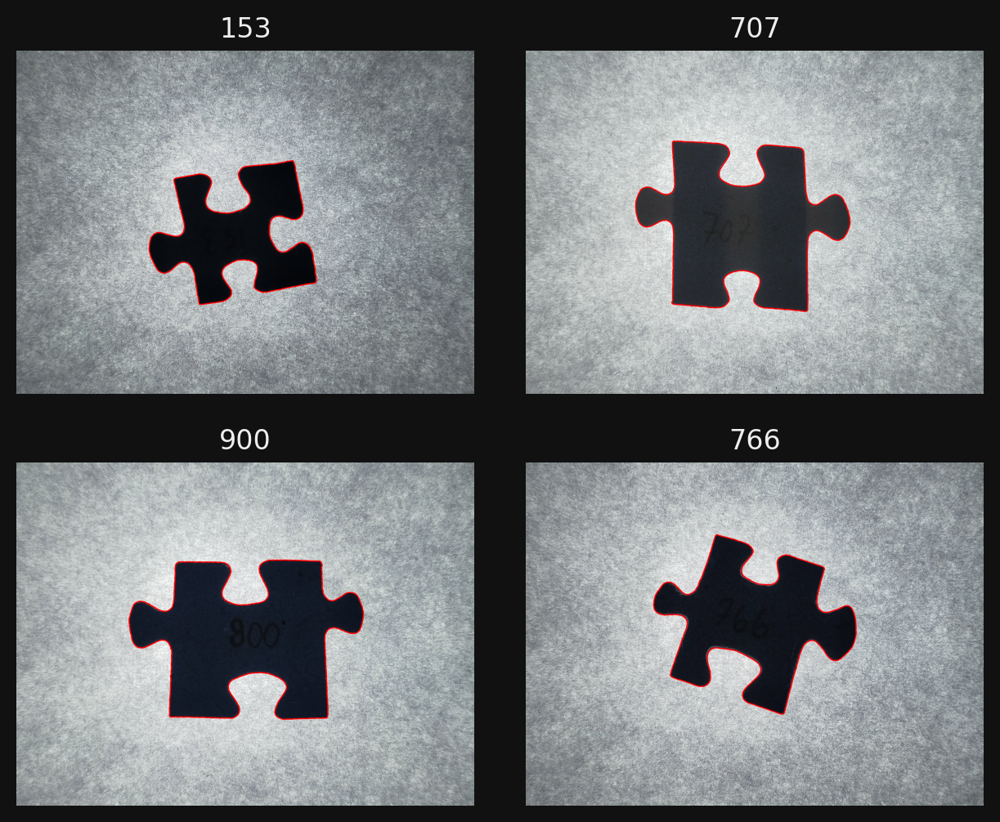

In [9]:
contours = {}
_preview = {}
for piece_id in tqdm(pieces_ids):
    contours[piece_id] = get_piece_contour(imgs_binary[piece_id])

    _preview[piece_id] = imgs_raw[piece_id].copy()
    for pixel in contours[piece_id]:
        _preview[piece_id] = cv2.circle(
            _preview[piece_id],
            np.int32(pixel),
            radius=5,
            color=RED,
            thickness=-1,
        )

show_imgs(_preview)

# Corner estimation

Draw previously extracted contours and identify regions in the image where corners may be present. Get centroids of those regions.


In [10]:
def draw_contours(contours: PixelArray, img_shape: tuple[int]) -> Image:
    img = np.zeros(img_shape, dtype="uint8")
    img[contours[:, 1], contours[:, 0]] = 255
    return img


def to_harris(img: Image) -> Image:
    img_harris = cv2.cornerHarris(img, blockSize=41, ksize=31, k=0.1)
    thresh = 0.05 * img_harris.max()
    return img_harris > thresh


def estimate_corners(img: Image) -> PointArray:
    *_, centroids = cv2.connectedComponentsWithStats(img.astype(np.uint8))
    return centroids[1:]

100%|██████████| 4/4 [00:00<00:00,  4.04it/s]


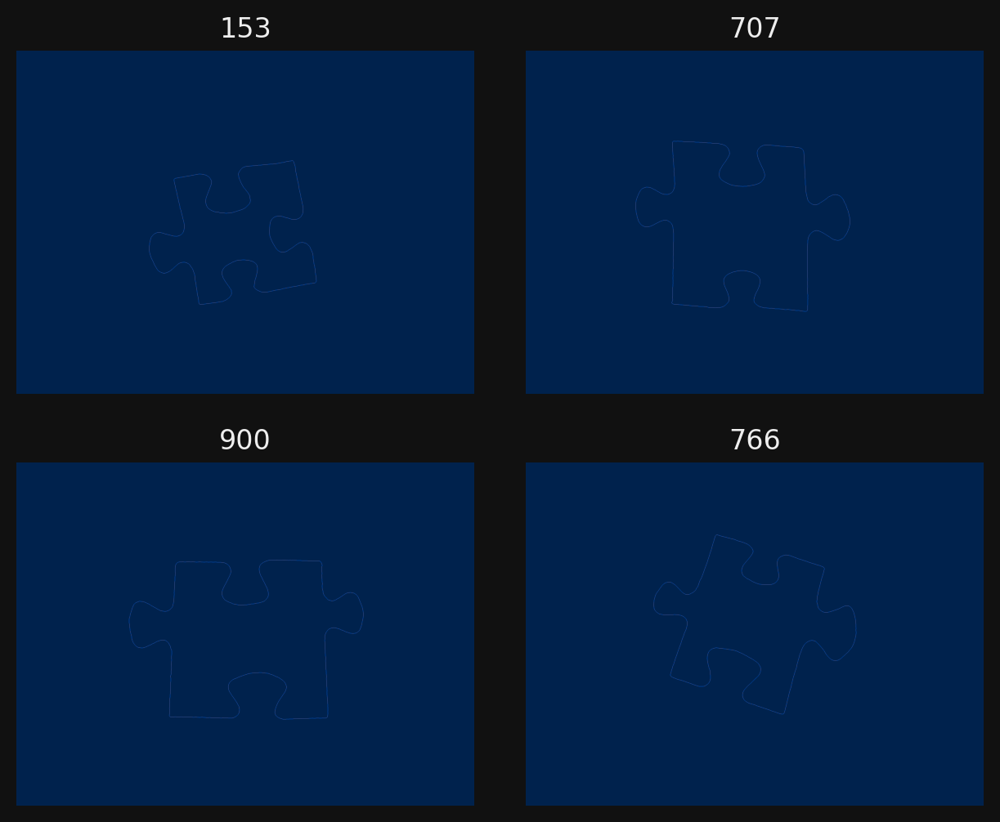

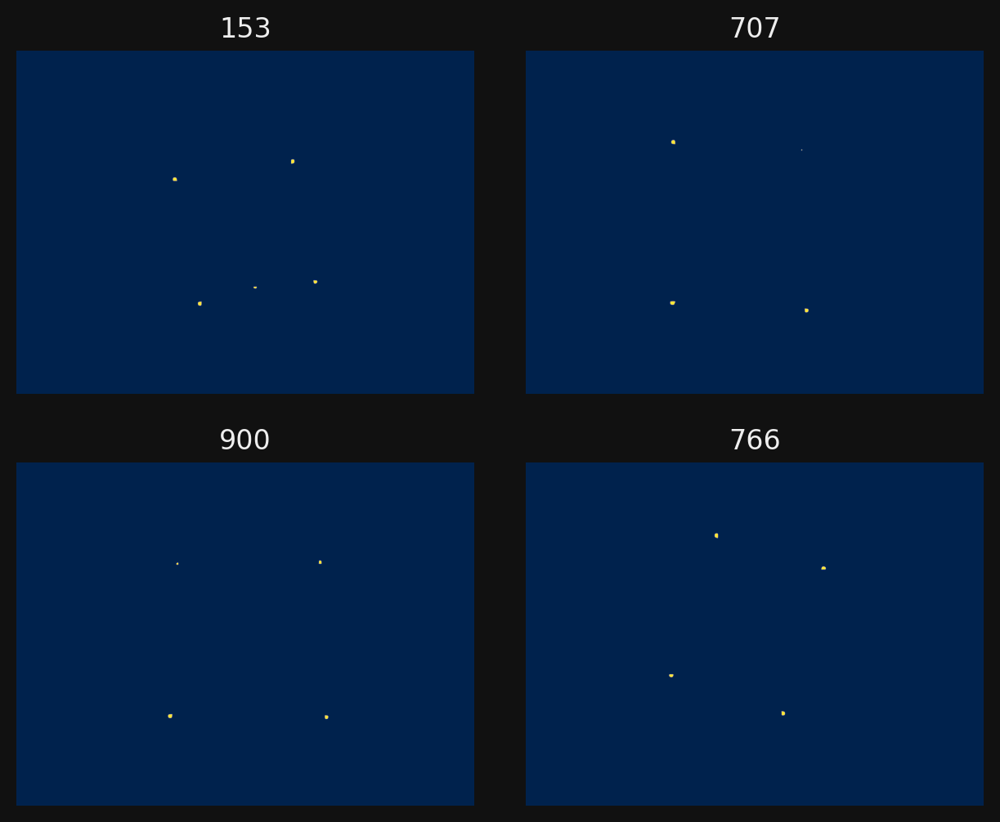

In [11]:
imgs_contours = {}
imgs_harris = {}
corners_estimated = {}
for piece_id in tqdm(pieces_ids):
    imgs_contours[piece_id] = draw_contours(contours[piece_id], imgs_binary[piece_id].shape)  # fmt: skip
    imgs_harris[piece_id] = to_harris(imgs_contours[piece_id])
    corners_estimated[piece_id] = estimate_corners(imgs_harris[piece_id])

show_imgs(imgs_contours)
show_imgs(imgs_harris)

100%|██████████| 4/4 [00:00<00:00, 39.60it/s]


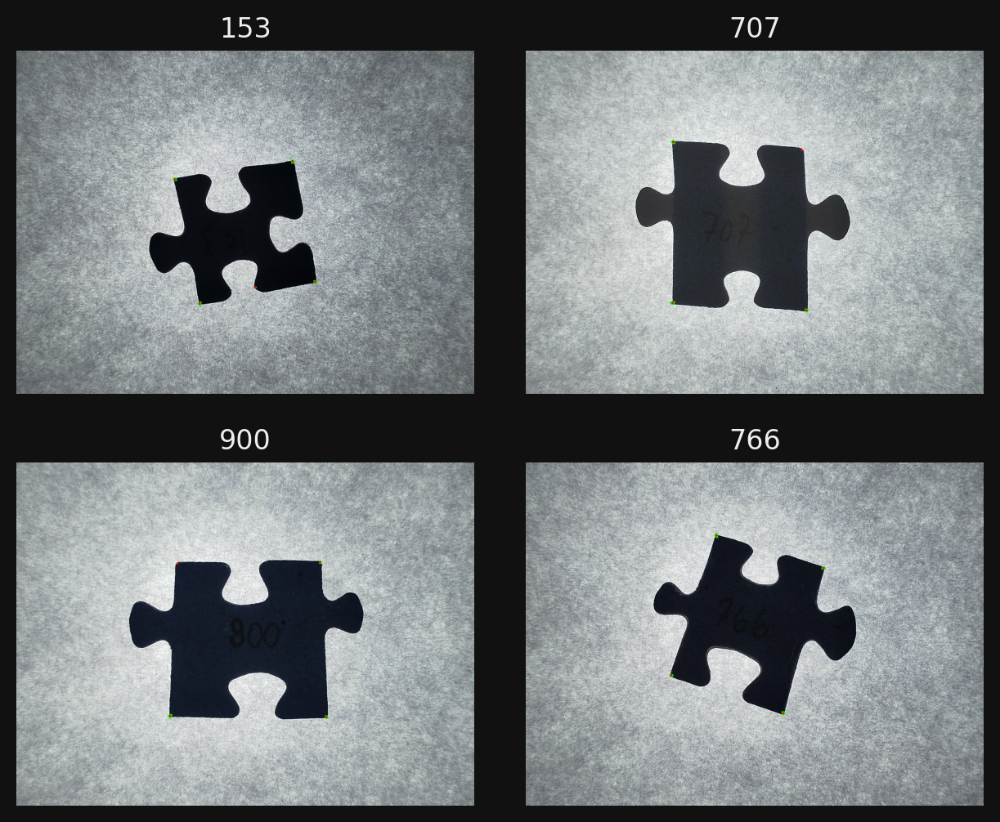

In [12]:
_preview = {}
for piece_id in tqdm(pieces_ids):
    _preview[piece_id] = imgs_raw[piece_id].copy()
    _preview[piece_id][imgs_harris[piece_id]] = GREEN
    for point in corners_estimated[piece_id]:
        _preview[piece_id] = cv2.circle(
            _preview[piece_id],
            np.int32(point),
            radius=10,
            color=RED,
            thickness=-1,
        )

show_imgs(_preview)

# Corner selection

*This is inspired by [this Medium article](https://towardsdatascience.com/solving-jigsaw-puzzles-with-python-and-opencv-d775ba730660).*

From the potential corner centroids estimated in the previous step, choose four that are most likely to represent the corners of the puzzle piece.

1. Iterate over all combinations of 4 points. A combination is discarded if the angle between any three consecutive points deviates from 90 degrees by more than the specified tolerance.
2. From the remaining combinations, choose the one with the largest area between points.

Note that for every combination, points are sorted clockwise. This is required for both selecting consecutive points and calculating area.


In [13]:
def _sort_points(points: PointArray) -> PointArray:
    """Sort list of points clockwise."""

    centroid = points.mean(axis=0)
    cx, cy = centroid

    x, y = points.T
    angles = np.arctan2(x - cx, y - cy)

    return points[np.argsort(angles)]


# TODO: Consider replacing with numpy: https://rosettacode.org/wiki/Shoelace_formula_for_polygonal_area#Python
def _shoelace_area(points: PointArray) -> float:
    """
    Calculate area of a polygon.

    Points (polygon corners) have to be sorted.
    """

    n = len(points)
    area = 0.0
    for i in range(n):
        j = (i + 1) % n
        area += points[i][0] * points[j][1]
        area -= points[j][0] * points[i][1]
    area = abs(area) / 2.0
    return area


def _angle_between_points(a: Point, b: Point, c: Point) -> float:
    """
    Calculate angle between points a, b, c, going from point a to c through b.

    This only returns 0-90 degrees (arccos).
    """

    ba = a - b
    bc = c - b

    cosine_angle = np.dot(ba, bc) / (np.linalg.norm(ba) * np.linalg.norm(bc))
    angle = np.arccos(cosine_angle)

    return np.degrees(angle)


def select_corners(corners: PointArray) -> PointArray:
    best_combination = None
    best_area = 0.0

    for combination in combinations(corners, 4):
        combination = _sort_points(np.array(combination))

        # Step 1: eliminate combination based on angles
        for i in range(4):
            left, center, right = combination[i - 2], combination[i - 1], combination[i]

            angle = _angle_between_points(left, center, right)

            if abs(90 - angle) > 15.0:
                break

        # Step 2: choose combination with largest area
        else:
            area = _shoelace_area(combination)
            if best_area < area:
                best_combination = combination
                best_area = area

    # Sanity check - if the correct combination is there, we should be able to select it
    assert best_combination is not None

    return best_combination

In [14]:
corners_selected = {}
for piece_id in tqdm(pieces_ids):
    corners_selected[piece_id] = select_corners(corners_estimated[piece_id])

100%|██████████| 4/4 [00:00<00:00, 3598.72it/s]


100%|██████████| 4/4 [00:00<00:00, 142.49it/s]


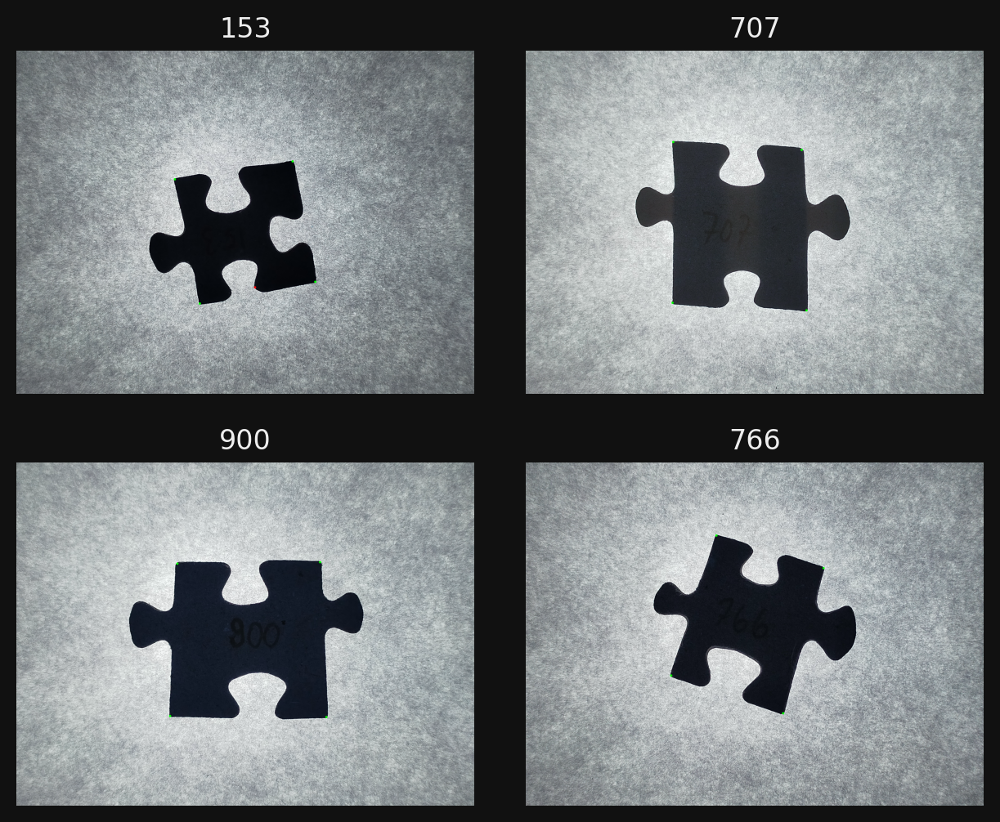

In [15]:
_preview = {}
for piece_id in tqdm(pieces_ids):
    _preview[piece_id] = imgs_raw[piece_id].copy()

    for point in corners_estimated[piece_id]:
        _preview[piece_id] = cv2.circle(
            _preview[piece_id],
            np.int32(point),
            radius=10,
            color=RED,
            thickness=-1,
        )

    for point in corners_selected[piece_id]:
        _preview[piece_id] = cv2.circle(
            _preview[piece_id],
            np.int32(point),
            radius=10,
            color=GREEN,
            thickness=-1,
        )


show_imgs(_preview)

# Corner refinement

Refine corners through an iterative process. Note that base image should be binary image, not the one with edges.


In [16]:
def refine_corners(img: Image, corners: PointArray) -> PointArray:
    return cv2.cornerSubPix(
        image=img,
        corners=np.float32(corners),
        winSize=(35, 35),
        zeroZone=(-1, -1),
        criteria=(cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.001),
    )

In [17]:
corners_refined = {}
for piece_id in tqdm(pieces_ids):
    corners_refined[piece_id] = refine_corners(
        imgs_binary[piece_id], corners_selected[piece_id]
    )

100%|██████████| 4/4 [00:00<00:00, 183.27it/s]


100%|██████████| 4/4 [00:00<00:00, 137.77it/s]


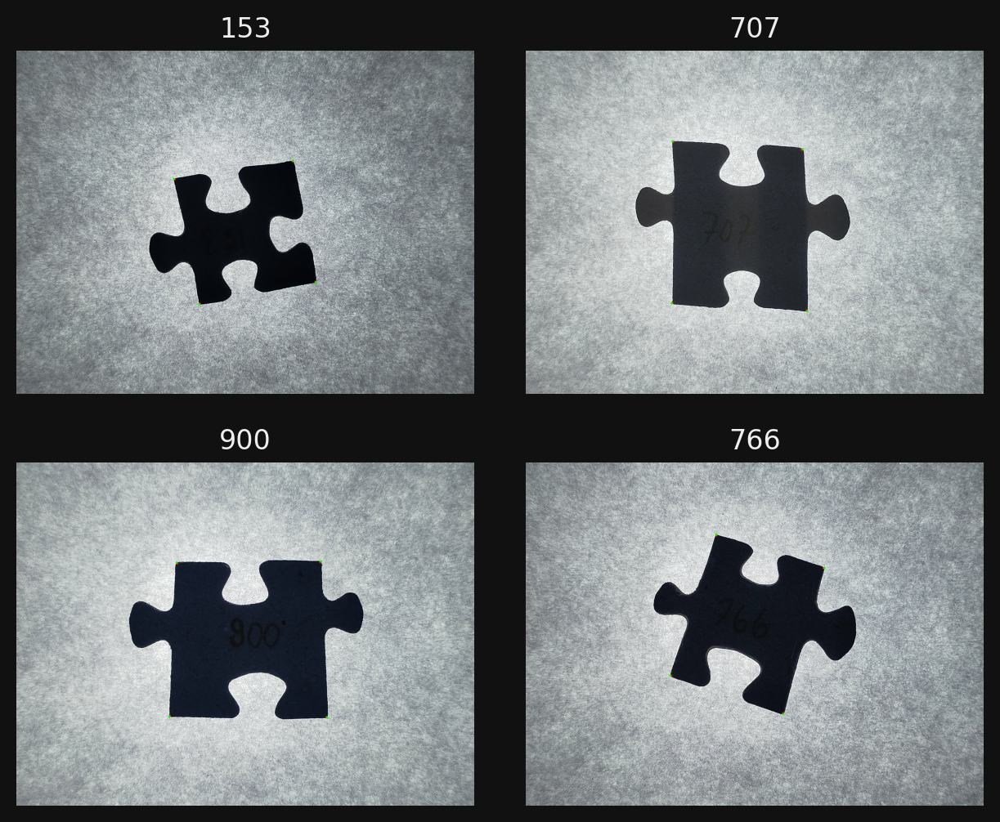

In [18]:
_preview = {}
for piece_id in tqdm(pieces_ids):
    _preview[piece_id] = imgs_raw[piece_id].copy()

    for point in corners_selected[piece_id]:
        _preview[piece_id] = cv2.circle(
            _preview[piece_id],
            np.int32(point),
            radius=10,
            color=RED,
            thickness=-1,
        )

    for point in corners_refined[piece_id]:
        _preview[piece_id] = cv2.circle(
            _preview[piece_id],
            np.int32(point),
            radius=10,
            color=GREEN,
            thickness=-1,
        )

show_imgs(_preview)

# Complete dataset

In [19]:
ray.init()

2024-01-27 15:10:49,550	INFO worker.py:1724 -- Started a local Ray instance.


Python version:,3.11.6
Ray version:,2.9.0


In [20]:
OUT_DIR = os.path.join("data", "out_01")
PREVIEW_DIR = os.path.join(OUT_DIR, "preview")

if os.path.exists(OUT_DIR):
    shutil.rmtree(OUT_DIR)
os.makedirs(OUT_DIR)

if os.path.exists(PREVIEW_DIR):
    shutil.rmtree(PREVIEW_DIR)
os.makedirs(PREVIEW_DIR)


@ray.remote
def process_image(
    file_name: str,
) -> Optional[tuple[int, PixelArray, PointArray]]:
    piece_id = get_piece_id(file_name)

    try:
        img_raw = load_img(os.path.join(IMGS_DIR, file_name))
        img_binary = to_binary(to_blurred(to_grayscale(img_raw)))
        contour = get_piece_contour(img_binary)
        img_contour = draw_contours(contour, img_binary.shape)
        corners_potential = estimate_corners(to_harris(img_contour))
        corners_selected = select_corners(corners_potential)
        corners = refine_corners(img_binary, corners_selected)
    except Exception as e:
        log.error(
            f"Exception while processing image {file_name}:\n"
            "".join(format_exception(type(e), e, e.__traceback__))
        )
        return None

    # Export preview
    for point in contour:
        img_raw = cv2.circle(img_raw, np.int32(point), 3, color=RED, thickness=-1)

    for point in corners:
        img_raw = cv2.circle(img_raw, np.int32(point), 5, color=BLUE, thickness=-1)

    cv2.imwrite(os.path.join(PREVIEW_DIR, file_name), img_raw)

    return piece_id, contour, corners


def yield_ray(tasks: list[ray.ObjectRef]) -> Any:
    while tasks:
        done, tasks = ray.wait(tasks)
        yield ray.get(done[0])


log.info("Queueing up...")
tasks = [process_image.remote(f) for f in os.listdir(IMGS_DIR)]

log.info("Waiting for results...")
OUT = [result for result in tqdm(yield_ray(tasks), total=len(tasks))]

log.info("Writing...")
with open(os.path.join(OUT_DIR, "out.pickle"), "wb") as f:
    pickle.dump(OUT, f)

[2024-01-27 15:11:45][INFO] Queueing up...
[2024-01-27 15:11:46][INFO] Waiting for results...


100%|██████████| 2000/2000 [11:03<00:00,  3.01it/s]

[2024-01-27 15:22:50][INFO] Writing...


In [21]:
ray.shutdown()